In [1]:
import qiskit
from qiskit import transpile, assemble
from qiskit.visualization import *
import numpy as np
import matplotlib.pyplot as plt

import torch
from torch.autograd import Function
from torchvision import datasets, transforms
from torchvision import models
from torchsummary import summary
from torch.utils.data import Dataset, DataLoader, TensorDataset
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F

In [2]:
Datrain1=np.load('Datatrain.npy')
Datest1=np.load('Datatest.npy')
labeltr=np.load('labeltr.npy')
labelte=np.load('labelte.npy')
Datrain=Datrain1/np.max(Datrain1)
Datest=Datest1/np.max(Datest1)
tensor_train = torch.from_numpy(Datrain).float()
tensor_test = torch.from_numpy(Datest).float()
tensor_train_label = torch.from_numpy(labeltr).long()
tensor_test_label = torch.from_numpy(labelte).long()

print(tensor_train.size())
print(tensor_test.size())

torch.Size([30000, 40, 40])
torch.Size([10000, 40, 40])


In [3]:
class QuantumCircuit:

    
    def __init__(self, n_qubits, backend, shots):
        self._circuit = qiskit.QuantumCircuit(n_qubits)
        
        all_qubits = [i for i in range(n_qubits)]
        self.theta = qiskit.circuit.Parameter('theta')
        
        self._circuit.h(all_qubits)
        self._circuit.barrier()
        self._circuit.ry(self.theta, all_qubits)
        
        self._circuit.measure_all()

        self.backend = backend
        self.shots = shots
    
    def run(self, thetas):
        t_qc = transpile(self._circuit,self.backend)
        qobj = assemble(t_qc,shots=self.shots,parameter_binds = [{self.theta: theta} for theta in thetas])
        job = self.backend.run(qobj)
        result = job.result().get_counts()
        
        counts = np.array(list(result.values()))
        states = np.array(list(result.keys())).astype(float)
        
        probabilities = counts / self.shots
        expectation = np.sum(states * probabilities)
        
        return np.array([expectation])
simulator = qiskit.Aer.get_backend('aer_simulator')

circuit = QuantumCircuit(1, simulator, 100)
print('Expected value for rotation pi {}'.format(circuit.run([np.pi])[0]))
circuit._circuit.draw()

Expected value for rotation pi 0.43


┌───┐ ░ ┌───────────┐ ░ ┌─┐
     q: ┤ H ├─░─┤ Ry(theta) ├─░─┤M├
        └───┘ ░ └───────────┘ ░ └╥┘
meas: 1/═════════════════════════╩═
                                 0

In [4]:
class HybridFunction(Function):
    
    @staticmethod
    def forward(ctx, input, quantum_circuit, shift):
        """ Forward pass computation """
        ctx.shift = shift
        ctx.quantum_circuit = quantum_circuit

        expectation_z = ctx.quantum_circuit.run(input[0].tolist())
        result = torch.tensor([expectation_z])
        ctx.save_for_backward(input, result)

        return result
        
    @staticmethod
    def backward(ctx, grad_output):
        input, expectation_z = ctx.saved_tensors
        input_list = np.array(input.tolist())
        
        shift_right = input_list + np.ones(input_list.shape) * ctx.shift
        shift_left = input_list - np.ones(input_list.shape) * ctx.shift
        
        gradients = []
        for i in range(len(input_list)):
            expectation_right = ctx.quantum_circuit.run(shift_right[i])
            expectation_left  = ctx.quantum_circuit.run(shift_left[i])
            
            gradient = torch.tensor([expectation_right]) - torch.tensor([expectation_left])
            gradients.append(gradient)
        gradients = np.array([gradients]).T
        return torch.tensor([gradients]).float() * grad_output.float(), None, None

class Hybrid(nn.Module):
    
    def __init__(self, backend, shots, shift):
        super(Hybrid, self).__init__()
        self.quantum_circuit = QuantumCircuit(1, backend, shots)
        self.shift = shift
        
    def forward(self, input):
        return HybridFunction.apply(input, self.quantum_circuit, self.shift)

In [5]:
my_dataset = TensorDataset(tensor_train,tensor_train_label) # create your datset
my_dataloader = DataLoader(my_dataset,batch_size=1,shuffle=True) # create your dataloader

In [6]:
my_dataset_test=TensorDataset(tensor_test,tensor_test_label)
my_dataloader_test=DataLoader(my_dataset_test,batch_size=1,shuffle=True)

In [7]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 6, kernel_size=5)
        self.conv2 = nn.Conv2d(6, 16, kernel_size=5)
        self.fc1 = nn.Linear(784 , 64)
        self.dropout = nn.Dropout2d()
        self.fc2 = nn.Linear(64, 1)
        self.hybrid = Hybrid(qiskit.Aer.get_backend('aer_simulator'), 100, np.pi / 2)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.conv2(x))
        x = self.dropout(x)
        x = F.max_pool2d(x, 2)
        x = x.view(1, -1)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        x = self.hybrid(x)
        return torch.cat((x, 1 - x), -1)

In [8]:
model = Net()
optimizer = optim.Adam(model.parameters(), lr=0.001)
loss_func = torch.nn.BCELoss()

epochs = 2
loss_list = []
loss_list1=[]
total_loss1=[]
accuracies=[]
model.train()
for epoch in range(epochs):
    total_loss = []
    i=0
    print('epoch:')
    print(epoch)
    correct1=0
    for batch_idx, (data, target) in enumerate(my_dataloader):
        optimizer.zero_grad()
        i=i+1
        # Forward pass
        output = model(data)
        # Calculating loss
        print(i)
        print(output)
        output1=abs((1-target[0])-output[0][target[0]]).unsqueeze(0)
        print(output1)
        print(target)
        loss = loss_func(output1, target.double())

        print(loss)
        # Backward pass
        loss.backward()
        # Optimize the weights
        optimizer.step()
        
        total_loss.append(loss.item())
        total_loss1.append(loss.item())
        if (batch_idx==9999 or batch_idx==19999 or batch_idx==29999):
            loss_list1.append(sum(total_loss1)/len(total_loss1))
            total_loss1=[]
        pred1 = output.argmax(dim=1, keepdim=True) 
        correct1 += pred1.eq(target.view_as(pred1)).sum().item()
    accuracies.append((correct1/30000)*100)
    print('correct: ', correct1)
    loss_list.append(sum(total_loss)/len(total_loss))
    print('Training [{:.0f}%]\tLoss: {:.4f}'.format(
        100. * (epoch + 1) / epochs, loss_list[-1]))

epoch:
0
1
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
t

C:\Users\nadia\anaconda3\lib\site-packages\torch\nn\functional.py:1338: UserWarning: dropout2d: Received a 3D input to dropout2d and assuming that channel-wise 1D dropout behavior is desired - input is interpreted as shape (N, C, L), where C is the channel dim. This behavior will change in a future release to interpret the input as one without a batch dimension, i.e. shape (C, H, W). To maintain the 1D channel-wise dropout behavior, please switch to using dropout1d instead.
  warnings.warn("dropout2d: Received a 3D input to dropout2d and assuming that channel-wise "
C:\Users\nadia\AppData\Local\Temp\ipykernel_13500\2571825612.py:11: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:204.)
  result = torch.tensor([expectation_z]

tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7

tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
49
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
50
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
51
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
52
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
87
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
88
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
89
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
90
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([

tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
127
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
128
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
129
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
130
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
167
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
168
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
169
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
170
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
205
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
206
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
207
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
208
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2

tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
245
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
246
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
247
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
248
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

282
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
283
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
284
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
285
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
286
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
322
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
323
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
324
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
325
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
364
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
365
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
366
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
367
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
406
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
407
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
408
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
409
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
448
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
449
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
450
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
451
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
484
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
485
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
486
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
487
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
526
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
527
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
528
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
529
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
568
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
569
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
570
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
571
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
610
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
611
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
612
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
613
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
652
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
653
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
654
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
655
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
694
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
695
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
696
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
697
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
736
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
737
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
738
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
739
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
777
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
778
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
779
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
780
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([

tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
819
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
820
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
821
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
822
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
861
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
862
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
863
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
864
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
900
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
901
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
902
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
903
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
942
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
943
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
944
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
945
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
984
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
985
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
986
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
987
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1025
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1026
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1027
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1028
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1061
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1062
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1063
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1064
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1096
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1097
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1098
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1099
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntr

tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1132
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1133
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1134
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1135
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1174
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1175
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1176
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1177
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1216
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1217
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1218
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1219
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1258
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1259
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1260
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1261
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1300
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1301
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1302
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1303
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1342
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1343
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1344
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1345
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1384
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1385
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1386
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1387
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1426
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1427
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1428
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1429
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1468
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1469
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1470
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1471
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1510
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1511
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1512
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1513
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1552
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1553
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1554
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1555
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1593
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1594
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1595
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1596
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1635
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1636
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1637
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1638
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1676
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1677
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1678
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1679
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1716
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1717
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1718
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1719
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1757
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1758
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1759
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1760
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1798
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1799
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1800
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1801
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1840
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1841
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1842
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1843
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1881
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1882
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1883
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1884
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1923
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1924
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1925
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1926
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1964
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1965
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1966
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1967
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntr

tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2006
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2007
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2008
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2009
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2047
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2048
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2049
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2050
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2089
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2090
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2091
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2092
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2131
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2132
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2133
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2134
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2173
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2174
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2175
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2176
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2215
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2216
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2217
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2218
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2257
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2258
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2259
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2260
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2298
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2299
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2300
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2301
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2340
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2341
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2342
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2343
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2380
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2381
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2382
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2383
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntr

tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2422
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2423
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2424
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2425
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2464
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2465
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2466
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2467
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2506
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2507
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2508
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2509
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2545
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2546
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2547
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2548
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)


2586
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2587
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2588
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2589
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2590
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2627
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2628
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2629
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2630
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2670
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2671
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2672
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2673
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2712
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2713
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2714
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2715
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2753
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2754
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2755
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2756
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2795
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2796
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2797
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2798
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2837
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2838
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2839
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2840
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2877
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2878
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2879
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2880
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2918
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2919
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2920
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2921
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntr

tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2960
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2961
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2962
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2963
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3002
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3003
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3004
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3005
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3043
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3044
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3045
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3046
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3084
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3085
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3086
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3087
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3126
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3127
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3128
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3129
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3167
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3168
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3169
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3170
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3208
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3209
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3210
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3211
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3250
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3251
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3252
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3253
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3289
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3290
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3291
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3292
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3330
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3331
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3332
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3333
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3372
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3373
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3374
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3375
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3412
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3413
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3414
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3415
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3454
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3455
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3456
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3457
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3496
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3497
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3498
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3499
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3537
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3538
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3539
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3540
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3578
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3579
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3580
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3581
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3620
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3621
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3622
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3623
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3661
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3662
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3663
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3664
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3700
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3701
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3702
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3703
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3737
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3738
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3739
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3740
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3775
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3776
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3777
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3778
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3814
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3815
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3816
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3817
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tens

tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3852
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3853
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3854
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3855
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)


3891
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3892
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3893
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3894
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3895
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3930
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3931
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3932
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3933
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3968
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3969
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3970
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3971
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4004
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4005
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4006
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4007
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4040
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4041
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4042
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4043
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)


4077
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4078
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4079
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4080
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4081
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4116
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4117
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4118
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4119
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)


4154
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4155
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4156
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4157
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4158
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackwar

4192
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4193
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4194
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4195
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4196
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4233
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4234
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4235
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4236
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4272
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4273
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4274
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4275
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4308
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4309
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4310
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4311
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4344
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4345
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4346
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4347
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)


4381
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4382
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4383
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4384
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4385
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackwar

4420
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4421
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4422
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4423
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4424
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackwar

4457
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4458
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4459
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4460
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4461
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackwar

4496
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4497
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4498
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4499
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4500
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4536
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4537
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4538
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4539
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4575
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4576
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4577
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4578
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4614
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4615
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4616
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4617
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0

tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4653
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4654
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4655
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4656
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4692
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4693
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4694
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4695
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)


4731
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4732
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4733
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4734
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4735
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackwar

4769
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4770
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4771
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4772
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4773
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackwar

4805
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4806
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4807
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4808
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4809
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackwar

4846
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4847
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4848
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4849
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4850
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4887
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4888
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4889
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4890
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4928
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4929
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4930
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4931
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)


4967
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4968
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4969
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4970
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4971
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5007
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5008
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5009
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5010
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)


5046
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5047
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5048
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5049
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5050
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5087
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5088
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5089
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5090
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([1])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5126
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5127
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5128
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5129
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntr

5165
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5166
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5167
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5168
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5169
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackwar

5204
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5205
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5206
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5207
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5208
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackwar

5243
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5244
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5245
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5246
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5247
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackwar

5282
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5283
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5284
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5285
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5286
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5322
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5323
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5324
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5325
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5360
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5361
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5362
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5363
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5400
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5401
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5402
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5403
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntr

5441
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5442
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5443
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5444
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5445
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackwar

5482
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5483
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5484
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5485
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5486
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackwar

5521
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5522
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5523
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5524
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5525
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5560
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5561
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5562
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5563
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntr

tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5598
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5599
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5600
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5601
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5636
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5637
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5638
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5639
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)


5673
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5674
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5675
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5676
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5677
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5712
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5713
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5714
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5715
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5751
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5752
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5753
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5754
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)


5790
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5791
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5792
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5793
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5794
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackwar

5826
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5827
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5828
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5829
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5830
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5863
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5864
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5865
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5866
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)


5898
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5899
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5900
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5901
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5902
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackwar

5938
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5939
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5940
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5941
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5942
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackwar

5974
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5975
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5976
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5977
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5978
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackwar

6011
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6012
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6013
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6014
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6015
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6049
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6050
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6051
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6052
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)


6084
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6085
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6086
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6087
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6088
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackwar

6121
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6122
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6123
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6124
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6125
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6158
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6159
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6160
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6161
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)


6194
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6195
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6196
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6197
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6198
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6233
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6234
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6235
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6236
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)


6268
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6269
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6270
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6271
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6272
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
ten

tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6305
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6306
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6307
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6308
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6342
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6343
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6344
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6345
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6378
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(3.5066, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6379
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6380
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6381
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700],

tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6414
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6415
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6416
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6417
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)


6452
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6453
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6454
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6455
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6456
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6492
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6493
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6494
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6495
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6531
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6532
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6533
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6534
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)


6567
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6568
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6569
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6570
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6571
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6604
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6605
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6606
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6607
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([

tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6644
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6645
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6646
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6647
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6680
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6681
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6682
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6683
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6720
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6721
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6722
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6723
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)


6759
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6760
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6761
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6762
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6763
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6796
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6797
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6798
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6799
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6835
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6836
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6837
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6838
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6873
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6874
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6875
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6876
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tens

tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6909
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6910
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6911
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6912
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6947
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6948
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6949
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6950
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)


6985
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6986
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6987
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6988
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6989
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7022
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7023
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7024
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7025
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7059
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7060
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7061
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7062
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)


7094
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7095
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7096
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7097
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7098
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7135
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7136
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7137
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7138
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)


7170
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7171
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7172
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7173
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7174
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7209
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7210
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7211
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7212
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7245
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7246
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7247
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7248
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7281
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7282
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7283
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7284
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7318
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7319
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7320
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7321
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)


7357
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7358
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7359
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7360
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7361
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7396
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7397
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7398
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7399
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000],

tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7436
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7437
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7438
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7439
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7476
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7477
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7478
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7479
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7516
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7517
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7518
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7519
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)


7554
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7555
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7556
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7557
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7558
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6

tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7595
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7596
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7597
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7598
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7635
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7636
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7637
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7638
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)


7675
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7676
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7677
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7678
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7679
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7716
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7717
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7718
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7719
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7756
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7757
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7758
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7759
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7793
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7794
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7795
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7796
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000],

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7833
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7834
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7835
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7836
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7872
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7873
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7874
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7875
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)


7911
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7912
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7913
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7914
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7915
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7948
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7949
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7950
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7951
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7984
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7985
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7986
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7987
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8020
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8021
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8022
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8023
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)


8056
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8057
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8058
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8059
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8060
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8097
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8098
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8099
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8100
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8133
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8134
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8135
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8136
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8169
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8170
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8171
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8172
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8206
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8207
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8208
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8209
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)


8245
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8246
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8247
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8248
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8249
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8282
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8283
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8284
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8285
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8320
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8321
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8322
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8323
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8359
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8360
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8361
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8362
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8395
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8396
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8397
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8398
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000],

tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8433
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8434
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8435
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8436
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)


8472
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8473
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8474
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8475
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8476
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8509
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8510
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8511
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8512
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400],

tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8549
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8550
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8551
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8552
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400],

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8589
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8590
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8591
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8592
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8628
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8629
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8630
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8631
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8668
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8669
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8670
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8671
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8704
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8705
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8706
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8707
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8744
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8745
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8746
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8747
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8784
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8785
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8786
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8787
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0

8821
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8822
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8823
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8824
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8825
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8863
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8864
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8865
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8866
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8903
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8904
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8905
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8906
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8942
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8943
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8944
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8945
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8982
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8983
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8984
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8985
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9018
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9019
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9020
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9021
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9057
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9058
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9059
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9060
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9095
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9096
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9097
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9098
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)


9132
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9133
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9134
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9135
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9136
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9169
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9170
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9171
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9172
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9206
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9207
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9208
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9209
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9243
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9244
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9245
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9246
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)


9279
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9280
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9281
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9282
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9283
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9316
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9317
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9318
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9319
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600],

9353
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9354
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9355
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9356
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9357
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackwar

9392
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9393
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9394
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9395
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9396
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackwar

9430
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9431
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9432
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9433
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9434
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackwar

9468
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9469
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9470
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9471
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9472
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackwar

9508
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9509
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9510
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9511
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9512
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9546
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9547
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9548
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9549
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9582
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9583
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9584
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9585
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9619
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9620
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9621
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9622
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)


9654
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9655
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9656
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9657
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9658
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9691
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9692
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9693
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9694
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600],

9728
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9729
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9730
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9731
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9732
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackwar

9765
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9766
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9767
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9768
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9769
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0

tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9803
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9804
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9805
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9806
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)


9840
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9841
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9842
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9843
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9844
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9879
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9880
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9881
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9882
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9916
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9917
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9918
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9919
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)


9953
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9954
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9955
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9956
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9957
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9991
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9992
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9993
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9994
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tens

10027
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10028
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10029
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10030
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10031
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBa

tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10065
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10066
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10067
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10068
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10069
ten

10101
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10102
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10103
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10104
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10105
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBa

10141
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10142
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10143
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10144
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10145
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

10179
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10180
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10181
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10182
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10183
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10216
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10217
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10218
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10219
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10257
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10258
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10259
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10260
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10295
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10296
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10297
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10298
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10332
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10333
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10334
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10335
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackw

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10369
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10370
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10371
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10372
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10406
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10407
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10408
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10409
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.17

tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10444
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10445
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10446
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10447
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward

10480
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10481
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10482
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10483
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10484
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBa

10519
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10520
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10521
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10522
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10523
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBa

10558
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10559
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10560
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10561
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10562
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

10596
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10597
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10598
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10599
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10600
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBa

10635
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10636
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10637
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10638
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10639
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10674
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10675
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10676
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10677
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10712
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10713
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10714
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10715
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10750
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10751
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10752
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10753
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCross

10789
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10790
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10791
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10792
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10793
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], d

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10829
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10830
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10831
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10832
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10865
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10866
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10867
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10868
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10905
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10906
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10907
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10908
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10946
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10947
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10948
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10949
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward

10984
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10985
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10986
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10987
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10988
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11024
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11025
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11026
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11027
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11061
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11062
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11063
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11064
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11098
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11099
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11100
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11101
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward

11134
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11135
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11136
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11137
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11138
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

11174
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11175
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11176
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11177
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11178
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11214
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11215
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11216
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11217
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11252
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11253
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11254
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11255
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11290
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11291
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11292
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11293
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11329
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11330
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11331
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11332
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

11365
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11366
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11367
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11368
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11369
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11404
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11405
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11406
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11407
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

11445
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11446
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11447
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11448
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11449
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11482
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11483
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11484
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11485
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.13

11519
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11520
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11521
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11522
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11523
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11561
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11562
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11563
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11564
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11599
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11600
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11601
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11602
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

11634
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11635
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11636
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11637
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11638
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11673
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11674
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11675
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11676
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11709
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11710
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11711
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11712
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11745
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11746
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11747
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11748
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.61

tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11782
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11783
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11784
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11785
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11822
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11823
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11824
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11825
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11858
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11859
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11860
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11861
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward

11895
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11896
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11897
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11898
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11899
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11936
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.8134, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11937
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11938
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11939
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11977
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11978
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11979
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11980
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12017
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12018
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12019
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12020
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12053
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12054
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12055
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12056
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(3.2189, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12089
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12090
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12091
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12092
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12130
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12131
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12132
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12133
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12171
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12172
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12173
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12174
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12211
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12212
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12213
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12214
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tens

12249
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12250
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12251
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12252
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12253
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBa

12290
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12291
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12292
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12293
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12294
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12332
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12333
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12334
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12335
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

12372
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12373
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12374
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12375
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12376
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12409
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12410
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12411
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12412
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

12448
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12449
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12450
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12451
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12452
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12485
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12486
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12487
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12488
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

12523
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12524
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12525
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12526
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12527
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBa

12559
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12560
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12561
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12562
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12563
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12596
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12597
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12598
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12599
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12635
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12636
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12637
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12638
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12674
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12675
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12676
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12677
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12714
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12715
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12716
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12717
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12752
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12753
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12754
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12755
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12791
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12792
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12793
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12794
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12828
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12829
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12830
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12831
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12866
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12867
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12868
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12869
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12902
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12903
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12904
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12905
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward

12940
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12941
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12942
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12943
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12944
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12978
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12979
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12980
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12981
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.82

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13014
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13015
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13016
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13017
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13055
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13056
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13057
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13058
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13093
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13094
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13095
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13096
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13133
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13134
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13135
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13136
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward

13173
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13174
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13175
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13176
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13177
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13213
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13214
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13215
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13216
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward

13252
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13253
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13254
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13255
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13256
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBa

13293
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13294
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13295
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13296
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13297
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13333
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13334
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13335
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13336
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13374
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13375
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13376
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13377
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.70

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13415
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13416
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13417
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13418
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

13455
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13456
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13457
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13458
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13459
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13496
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13497
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13498
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13499
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13532
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13533
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13534
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13535
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward

13567
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13568
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13569
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13570
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13571
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13604
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13605
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13606
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13607
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13644
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13645
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13646
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13647
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13685
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13686
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13687
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13688
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13722
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13723
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13724
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13725
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13762
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13763
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13764
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13765
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

13802
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13803
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13804
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13805
tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13806
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13843
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13844
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13845
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13846
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

13883
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13884
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13885
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13886
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13887
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13925
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13926
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13927
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13928
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13966
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13967
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13968
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13969
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14004
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14005
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14006
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14007
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14040
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14041
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14042
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14043
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward

14076
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14077
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14078
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14079
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14080
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBa

14113
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14114
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14115
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14116
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14117
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14150
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14151
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14152
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14153
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward

14188
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14189
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14190
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14191
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14192
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBa

14228
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14229
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14230
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14231
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14232
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14269
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14270
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14271
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14272
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

14304
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14305
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14306
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14307
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14308
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14341
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14342
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14343
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14344
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14381
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14382
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14383
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14384
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14419
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14420
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14421
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14422
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14459
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14460
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14461
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14462
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14495
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14496
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14497
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14498
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14531
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14532
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14533
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14534
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14567
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14568
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14569
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14570
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14604
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14605
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14606
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14607
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14642
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14643
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14644
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14645
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


14677
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14678
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14679
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14680
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14681
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBa

14714
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14715
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14716
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14717
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14718
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBa

14753
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14754
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14755
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14756
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14757
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14792
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14793
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14794
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14795
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14833
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14834
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14835
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14836
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14870
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14871
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14872
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14873
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14910
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14911
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14912
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14913
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14948
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14949
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14950
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14951
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14985
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14986
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14987
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14988
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.04

tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15024
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15025
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15026
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15027
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15061
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15062
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15063
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15064
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

15096
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15097
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15098
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15099
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15100
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBa

tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15132
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15133
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15134
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15135
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackw

tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15171
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15172
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15173
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15174
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward

15206
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15207
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15208
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15209
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15210
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBa

15242
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15243
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15244
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15245
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15246
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15281
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15282
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15283
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15284
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.82

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15317
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15318
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15319
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15320
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15353
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15354
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15355
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15356
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15393
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15394
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15395
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15396
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward

15433
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15434
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15435
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15436
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15437
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15471
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15472
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15473
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15474
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15508
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15509
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15510
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15511
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15548
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15549
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15550
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15551
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward

15586
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15587
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15588
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15589
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15590
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBa

15626
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15627
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15628
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15629
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15630
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], d

tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15663
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15664
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15665
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15666
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

15703
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15704
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15705
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15706
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15707
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBa

tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15743
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15744
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15745
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15746
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15782
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15783
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15784
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15785
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15823
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15824
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15825
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15826
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward

15862
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15863
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15864
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15865
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15866
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15899
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15900
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15901
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15902
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15936
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15937
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15938
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15939
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15971
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15972
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15973
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15974
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCross

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16010
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16011
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16012
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16013
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16051
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16052
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16053
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16054
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16087
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16088
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16089
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16090
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16126
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16127
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16128
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16129
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16165
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16166
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16167
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16168
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16203
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16204
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16205
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16206
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward

16239
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16240
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16241
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16242
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16243
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBa

16276
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16277
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16278
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16279
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16280
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16317
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16318
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16319
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16320
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16356
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16357
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16358
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16359
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16395
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16396
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16397
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16398
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward

16431
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16432
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16433
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16434
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16435
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16468
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16469
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16470
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16471
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16508
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16509
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16510
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16511
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward

16544
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16545
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16546
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16547
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16548
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBa

16580
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16581
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16582
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16583
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16584
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

16616
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16617
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16618
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16619
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16620
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16657
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16658
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16659
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16660
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16697
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16698
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16699
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16700
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.41

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16734
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16735
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16736
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16737
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16773
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16774
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16775
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16776
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.90

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16813
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16814
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16815
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16816
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16849
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16850
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16851
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16852
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16886
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16887
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16888
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16889
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16923
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16924
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16925
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16926
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

16960
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16961
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16962
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16963
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16964
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17000
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17001
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17002
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17003
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward

17037
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17038
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17039
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17040
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17041
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

17075
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17076
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17077
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17078
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17079
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17112
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17113
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17114
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17115
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17152
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17153
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17154
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17155
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward

tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17191
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17192
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17193
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17194
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackw

tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17230
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17231
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17232
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17233
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17270
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17271
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17272
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17273
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17307
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17308
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17309
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17310
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

17344
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17345
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17346
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17347
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17348
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17384
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17385
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17386
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17387
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=t

17420
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17421
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17422
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17423
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17424
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBa

17460
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17461
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17462
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17463
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17464
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBa

17500
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17501
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17502
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17503
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17504
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17539
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17540
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17541
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17542
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17576
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17577
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17578
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17579
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17612
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17613
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17614
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17615
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.31

tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17651
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17652
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17653
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17654
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

17688
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17689
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17690
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17691
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17692
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBa

17724
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17725
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17726
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17727
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17728
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBa

17760
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17761
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17762
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17763
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17764
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17797
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17798
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17799
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17800
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.8134, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17836
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17837
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17838
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17839
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17876
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17877
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17878
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17879
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.15

17913
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17914
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17915
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17916
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17917
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17954
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17955
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17956
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17957
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17992
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17993
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17994
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17995
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18028
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18029
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(3.2189, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18030
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18031
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18066
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18067
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18068
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18069
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.62

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18102
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18103
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18104
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18105
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

18138
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18139
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18140
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18141
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18142
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18175
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18176
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18177
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18178
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18212
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18213
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18214
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18215
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.05

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18248
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18249
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18250
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18251
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18284
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18285
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18286
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18287
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18322
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18323
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18324
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18325
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(100., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18359
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18360
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18361
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18362
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.

tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18397
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18398
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18399
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18400
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18436
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18437
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18438
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18439
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18473
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18474
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18475
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18476
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18514
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18515
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18516
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18517
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward

18554
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18555
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18556
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18557
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18558
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18593
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18594
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18595
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18596
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward

18629
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18630
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18631
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18632
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18633
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18666
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18667
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18668
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18669
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18702
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.5257, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18703
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18704
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18705
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward

18741
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18742
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18743
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18744
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18745
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18780
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18781
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18782
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18783
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18819
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18820
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18821
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18822
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18856
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18857
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18858
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18859
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18894
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18895
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18896
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18897
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18933
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18934
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18935
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18936
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward

18971
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18972
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18973
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18974
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18975
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19009
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19010
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19011
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19012
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19047
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19048
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19049
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19050
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19086
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19087
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19088
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19089
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.63

19122
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19123
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19124
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19125
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19126
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19162
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19163
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19164
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19165
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19199
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19200
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19201
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19202
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward

19236
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19237
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19238
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19239
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19240
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19274
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19275
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19276
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19277
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19311
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19312
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19313
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19314
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19349
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19350
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19351
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19352
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.12

19385
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19386
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19387
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19388
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19389
tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19423
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19424
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19425
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19426
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19459
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19460
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19461
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19462
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19496
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19497
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19498
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19499
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0

19532
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19533
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19534
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19535
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19536
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19571
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19572
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19573
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19574
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19608
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19609
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19610
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19611
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19647
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19648
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19649
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19650
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.23

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19685
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19686
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19687
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19688
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19722
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19723
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19724
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19725
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward

19760
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19761
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19762
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19763
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19764
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype

tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19799
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19800
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19801
tensor([[0.0500, 0.9500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19802
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19838
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19839
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19840
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19841
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward

19874
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19875
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19876
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19877
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19878
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

19911
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19912
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19913
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19914
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19915
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19950
tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19951
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19952
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19953
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.42

19989
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19990
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19991
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19992
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19993
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>

tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20027
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20028
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20029
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20030
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20065
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20066
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20067
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20068
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20102
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20103
tensor([[0.0400, 0.9600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20104
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20105
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20139
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20140
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20141
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20142
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward

20175
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20176
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20177
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20178
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20179
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20212
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20213
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20214
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20215
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

20250
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20251
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20252
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20253
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20254
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20288
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20289
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20290
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20291
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20325
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20326
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20327
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20328
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20363
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20364
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20365
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20366
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20401
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20402
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20403
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20404
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20437
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20438
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20439
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20440
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.8134, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20477
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20478
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20479
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20480
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20516
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20517
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20518
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20519
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20557
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20558
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20559
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20560
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward

20595
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20596
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20597
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20598
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20599
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20634
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20635
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20636
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20637
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20671
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20672
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20673
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20674
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.06

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20709
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.6593, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20710
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20711
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.9957, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20712
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20747
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20748
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20749
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20750
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20786
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20787
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20788
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20789
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20824
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20825
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20826
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20827
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20863
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20864
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20865
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20866
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20901
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20902
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20903
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20904
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20939
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20940
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20941
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20942
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0

tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20979
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20980
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20981
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20982
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCross

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21015
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21016
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21017
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21018
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward

21053
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21054
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21055
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21056
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21057
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21090
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21091
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21092
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21093
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.6593, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21130
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21131
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21132
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21133
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21170
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.6593, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21171
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21172
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21173
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21209
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21210
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21211
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21212
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21245
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21246
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21247
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21248
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward

21281
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21282
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21283
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21284
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21285
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

21319
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21320
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21321
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21322
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21323
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBa

21359
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21360
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21361
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21362
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21363
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21396
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21397
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21398
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21399
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21436
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21437
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21438
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21439
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21473
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21474
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21475
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21476
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward

21510
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21511
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21512
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21513
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21514
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21550
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21551
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21552
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21553
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21588
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21589
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21590
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21591
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward

21628
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21629
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21630
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21631
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21632
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], d

tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21666
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21667
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21668
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21669
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.20

tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21705
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21706
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21707
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21708
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21745
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21746
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21747
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21748
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21784
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21785
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21786
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21787
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21822
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21823
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21824
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21825
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21864
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21865
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21866
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21867
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21900
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21901
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21902
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21903
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward

21935
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21936
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21937
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21938
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21939
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBa

21971
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21972
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21973
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21974
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21975
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBa

tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22008
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22009
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22010
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22011
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0

22048
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22049
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22050
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22051
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22052
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22085
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22086
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22087
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22088
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22125
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22126
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22127
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22128
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.84

22164
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22165
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22166
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22167
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22168
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22204
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22205
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22206
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22207
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward

22242
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22243
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22244
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22245
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22246
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22279
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22280
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22281
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22282
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22315
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22316
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22317
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22318
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22355
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22356
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22357
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22358
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22391
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22392
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22393
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22394
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward

22427
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22428
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22429
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22430
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22431
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22465
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22466
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22467
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22468
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

22501
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22502
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22503
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22504
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22505
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

22539
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22540
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22541
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22542
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22543
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

22576
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22577
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22578
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22579
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22580
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22613
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22614
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22615
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22616
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22650
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22651
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22652
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22653
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22687
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22688
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22689
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22690
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22724
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22725
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22726
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22727
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22761
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22762
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22763
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22764
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.80

tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22798
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22799
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22800
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22801
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.274

tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22835
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22836
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22837
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22838
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22871
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22872
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22873
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22874
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22908
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22909
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22910
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22911
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22947
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22948
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22949
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22950
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22983
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22984
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22985
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22986
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23020
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23021
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23022
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23023
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23057
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23058
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23059
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23060
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23093
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23094
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23095
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23096
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23129
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23130
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23131
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23132
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23167
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23168
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23169
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23170
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23207
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23208
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23209
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23210
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

23242
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23243
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23244
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23245
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23246
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23282
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23283
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23284
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23285
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch

23319
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23320
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23321
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23322
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23323
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23357
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23358
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23359
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23360
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward

23394
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23395
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23396
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23397
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23398
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBa

23435
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23436
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23437
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23438
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23439
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23476
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23477
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23478
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23479
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.86

23516
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23517
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23518
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23519
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23520
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23553
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23554
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23555
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23556
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23591
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23592
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23593
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23594
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

23628
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23629
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23630
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23631
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23632
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23670
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23671
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23672
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23673
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23707
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23708
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23709
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23710
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.88

23743
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23744
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23745
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23746
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23747
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBa

23781
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23782
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23783
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23784
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23785
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBa

23819
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23820
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23821
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23822
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23823
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23858
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23859
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23860
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23861
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23895
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23896
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23897
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23898
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.25

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23932
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23933
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23934
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23935
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23968
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23969
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23970
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23971
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

24007
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24008
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24009
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24010
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24011
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24048
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24049
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24050
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24051
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24085
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24086
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24087
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24088
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24123
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24124
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24125
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24126
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackw

tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24164
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24165
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24166
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24167
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCross

24200
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24201
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24202
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24203
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24204
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBa

tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24237
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24238
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24239
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24240
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24276
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24277
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24278
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24279
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24313
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24314
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24315
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24316
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24351
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24352
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24353
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24354
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward

24387
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24388
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24389
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24390
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24391
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

24425
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24426
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24427
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24428
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24429
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24466
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24467
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24468
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24469
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24503
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24504
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24505
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24506
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward

24540
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24541
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24542
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24543
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24544
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24578
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24579
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24580
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24581
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24614
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24615
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24616
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24617
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24650
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24651
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24652
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24653
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackw

24687
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24688
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24689
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24690
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24691
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24724
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24725
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24726
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24727
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24760
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24761
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24762
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24763
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24796
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24797
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24798
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24799
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24834
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24835
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24836
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24837
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24871
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24872
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24873
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24874
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24909
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24910
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24911
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24912
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24945
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24946
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24947
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24948
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24983
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24984
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24985
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24986
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25019
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25020
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25021
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25022
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25060
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25061
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25062
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25063
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25096
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25097
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25098
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25099
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25132
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25133
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25134
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25135
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward

25172
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25173
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25174
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25175
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25176
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25209
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25210
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25211
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25212
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.10

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25246
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25247
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25248
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25249
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25285
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25286
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25287
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25288
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

25320
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25321
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25322
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25323
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25324
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25358
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25359
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25360
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25361
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward

tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25395
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25396
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25397
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25398
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25399
ten

tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25432
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25433
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25434
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25435
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward

25467
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25468
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25469
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25470
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25471
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25506
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25507
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25508
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.6593, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25509
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25543
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25544
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25545
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25546
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.82

tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25581
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25582
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25583
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25584
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.84

25616
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25617
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25618
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25619
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25620
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25656
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25657
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25658
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25659
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward

25692
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25693
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25694
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25695
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25696
tensor([[0.0500, 0.9500]], dtype=torch.float64, grad_fn=<CatBa

25728
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25729
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25730
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25731
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25732
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25765
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25766
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25767
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25768
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.06

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25807
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25808
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25809
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25810
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.03

tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25844
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25845
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25846
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25847
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25881
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25882
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25883
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25884
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

25919
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25920
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25921
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25922
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25923
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

25958
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25959
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25960
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25961
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25962
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBa

25997
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25998
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25999
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26000
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26001
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26038
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26039
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26040
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26041
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26079
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26080
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26081
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26082
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26119
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26120
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26121
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26122
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26155
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26156
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26157
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26158
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26192
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26193
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26194
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26195
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward

26228
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26229
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26230
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26231
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26232
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBa

26265
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26266
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26267
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26268
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26269
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26302
tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26303
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26304
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26305
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=t

tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26339
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26340
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26341
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26342
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26375
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26376
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26377
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26378
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


26413
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26414
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26415
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26416
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26417
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBa

26454
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26455
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26456
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26457
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26458
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26492
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26493
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26494
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26495
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26529
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26530
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26531
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26532
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26567
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26568
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26569
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26570
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26603
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26604
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26605
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26606
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward

26639
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26640
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26641
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26642
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26643
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], d

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26677
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26678
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26679
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26680
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26714
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26715
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26716
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26717
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26751
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26752
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26753
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26754
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26788
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26789
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26790
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26791
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26825
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26826
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26827
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26828
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26861
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26862
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26863
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26864
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26900
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26901
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26902
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26903
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26940
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26941
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26942
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26943
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26978
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26979
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26980
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26981
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27018
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27019
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27020
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27021
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27058
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27059
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27060
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27061
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27098
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27099
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27100
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27101
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.79

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27138
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27139
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27140
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27141
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27177
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27178
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27179
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27180
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27216
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27217
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27218
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27219
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

27255
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27256
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27257
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27258
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27259
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBa

27291
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27292
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27293
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27294
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27295
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27328
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27329
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27330
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27331
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27368
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27369
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27370
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27371
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward

27403
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27404
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27405
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27406
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27407
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27439
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27440
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27441
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27442
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCross

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27477
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27478
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27479
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27480
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=t

tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27517
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27518
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27519
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27520
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27553
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27554
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27555
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27556
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.77

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27591
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27592
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27593
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27594
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27629
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27630
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27631
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27632
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.77

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27668
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27669
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27670
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27671
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

27704
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27705
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27706
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27707
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27708
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27745
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27746
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27747
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27748
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27782
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27783
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27784
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27785
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27818
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27819
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27820
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27821
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward

27853
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27854
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27855
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27856
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27857
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27892
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27893
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27894
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27895
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27932
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27933
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27934
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27935
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.71

27967
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27968
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27969
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27970
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27971
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBa

28003
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28004
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28005
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28006
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28007
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28044
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28045
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28046
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28047
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28082
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28083
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28084
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28085
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.68

tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28119
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28120
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28121
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28122
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28155
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28156
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28157
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28158
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward

28190
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28191
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28192
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28193
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28194
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28231
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28232
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28233
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28234
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28270
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28271
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28272
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28273
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

28306
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28307
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28308
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28309
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28310
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28346
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28347
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28348
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28349
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28386
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28387
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28388
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28389
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward

28424
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28425
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28426
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28427
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28428
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBa

28464
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28465
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28466
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28467
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28468
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBa

28504
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28505
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28506
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28507
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28508
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28541
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28542
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28543
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28544
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28577
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28578
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28579
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28580
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28615
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28616
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28617
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28618
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28651
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28652
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28653
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28654
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28689
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28690
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28691
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28692
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

28726
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28727
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28728
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28729
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28730
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28767
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28768
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28769
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28770
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

28804
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28805
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28806
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28807
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28808
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28844
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28845
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28846
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28847
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward

28881
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28882
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28883
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28884
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28885
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28921
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28922
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28923
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28924
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28958
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28959
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28960
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28961
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

28997
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28998
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28999
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29000
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29001
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29038
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29039
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29040
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29041
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29075
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29076
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29077
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29078
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward

29111
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29112
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29113
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29114
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29115
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29152
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29153
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29154
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29155
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=t

29190
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29191
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29192
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29193
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29194
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29230
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29231
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29232
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29233
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29270
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29271
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29272
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29273
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29310
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29311
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29312
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29313
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29350
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29351
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29352
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29353
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29386
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29387
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29388
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29389
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29425
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29426
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29427
tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29428
tensor([[0.0500, 0.9500]], dtype=torch.float64, grad_fn=<CatBackward

29462
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29463
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29464
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29465
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29466
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29502
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29503
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29504
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29505
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_f

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29541
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29542
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29543
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29544
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward

29576
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29577
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29578
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29579
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29580
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29617
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29618
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29619
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29620
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29654
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29655
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29656
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29657
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward

29693
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29694
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29695
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29696
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29697
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBa

29733
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29734
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29735
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29736
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29737
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29774
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29775
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29776
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29777
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29813
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29814
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29815
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29816
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward

29852
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29853
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29854
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29855
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29856
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29892
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29893
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29894
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29895
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward

29930
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29931
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29932
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29933
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29934
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29971
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29972
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29973
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29974
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([

47
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
48
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
49
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.4079, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
50
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
51
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tenso

tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
84
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
85
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
86
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
87
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([

119
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
120
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
121
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
122
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
123
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100],

159
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
160
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
161
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
162
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
163
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700],

tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
200
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
201
tensor([[0.0500, 0.9500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
202
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
203
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
236
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
237
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
238
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
239
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.],

tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
272
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
273
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
274
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
275
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
312
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
313
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
314
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
315
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

353
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
354
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
355
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
356
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
357
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.8134, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
393
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
394
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
395
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
396
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
429
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
430
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
431
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
432
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.],

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
469
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
470
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
471
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
472
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
509
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
510
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
511
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
512
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyB

549
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
550
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
551
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
552
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
553
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
590
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
591
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
592
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
593
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.],

tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
627
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
628
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
629
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
630
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
667
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
668
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
669
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
670
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
707
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
708
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
709
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
710
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
747
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
748
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
749
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
750
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dty

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
786
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
787
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
788
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
789
tensor([[0.0500, 0.9500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9500], dty

823
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
824
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
825
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.8134, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
826
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
827
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
863
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
864
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
865
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
866
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

899
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
900
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
901
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
902
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
903
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800],

937
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
938
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
939
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
940
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
941
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
976
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
977
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
978
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
979
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

1015
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1016
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1017
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1018
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1019
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackwar

1054
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1055
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1056
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1057
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1058
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.5257, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1091
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1092
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1093
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1094
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200],

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1127
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1128
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1129
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1130
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([

1164
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1165
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1166
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1167
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1168
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackwar

1200
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1201
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1202
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1203
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1204
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackwar

1237
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1238
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1239
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1240
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1241
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1275
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1276
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1277
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1278
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1313
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1314
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1315
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1316
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1352
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1353
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.5257, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1354
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1355
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)


1391
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1392
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1393
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1394
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1395
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1429
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1430
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1431
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1432
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)


1468
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1469
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1470
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1471
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1472
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7

tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1507
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1508
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1509
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1510
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100],

tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1544
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1545
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1546
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1547
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tens

1582
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1583
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1584
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1585
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1586
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7

tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1620
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1621
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1622
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1623
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntr

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1658
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1659
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1660
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1661
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900],

tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1696
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1697
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1698
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1699
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)


1733
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1734
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1735
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1736
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1737
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackwar

1771
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1772
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1773
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1774
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1775
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2

tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1808
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1809
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1810
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1811
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1

1847
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1848
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1849
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1850
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1851
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1888
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1889
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1890
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1891
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900],

tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1927
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1928
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1929
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1930
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)


1964
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1965
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1966
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1967
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
1968
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2001
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2002
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2003
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2004
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([

tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2037
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2038
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2039
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2040
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2077
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2078
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2079
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2080
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2

tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2114
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2115
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2116
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2117
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)


2153
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2154
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2155
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2156
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2157
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackwar

2193
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2194
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2195
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2196
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2197
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackwar

2231
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2232
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2233
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2234
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2235
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
ten

tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2271
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2272
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2273
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2274
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2311
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2312
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2313
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2314
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2350
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2351
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2352
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2353
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)


2390
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2391
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2392
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2393
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2394
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2431
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2432
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2433
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2434
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)


2466
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2467
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2468
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2469
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2470
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2507
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2508
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2509
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2510
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2545
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2546
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2547
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2548
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)


2580
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2581
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2582
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2583
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2584
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackwar

2617
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2618
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2619
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2620
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2621
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2658
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2659
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2660
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2661
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2695
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2696
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2697
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2698
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2731
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2732
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2733
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2734
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2768
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2769
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2770
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2771
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2807
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2808
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2809
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2810
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2848
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2849
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2850
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2851
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2885
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2886
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2887
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2888
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)


2923
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2924
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2925
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2926
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2927
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2961
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2962
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2963
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2964
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300],

2996
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2997
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2998
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
2999
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3000
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3033
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3034
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3035
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3036
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3070
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3071
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3072
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3073
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tens

tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3110
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3111
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3112
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3113
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)


3146
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3147
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3148
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3149
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.8134, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3150
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3187
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3188
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3189
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3190
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)


3226
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3227
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3228
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3229
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3230
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
ten

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3267
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3268
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3269
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3270
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)


3305
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3306
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3307
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3308
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3309
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8

tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3345
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3346
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3347
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3348
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)


3383
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3384
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3385
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3386
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3387
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3422
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3423
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3424
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3425
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900],

3457
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3458
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3459
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3460
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3461
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3498
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3499
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3500
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3501
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3535
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3536
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3537
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3538
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3571
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3572
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3573
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3574
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3612
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3613
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3614
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3615
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3649
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3650
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3651
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3652
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)


3690
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3691
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3692
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3693
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3694
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5

tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3731
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3732
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3733
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3734
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3770
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3771
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3772
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3773
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900],

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3808
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3809
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3810
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3811
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3843
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3844
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3845
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3846
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntr

tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3883
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3884
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3885
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3886
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3921
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3922
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3923
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3924
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3957
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3958
tensor([[0.0500, 0.9500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3959
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3960
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([

tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3996
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3997
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3998
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
3999
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([

4034
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4035
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4036
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4037
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4038
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackwar

4073
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4074
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4075
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4076
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4077
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4110
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4111
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4112
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4113
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000],

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4147
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4148
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4149
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4150
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4184
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4185
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4186
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4187
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)


4224
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4225
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4226
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4227
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4228
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackwar

4264
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4265
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4266
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4267
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4268
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4302
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4303
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4304
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4305
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400],

tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.6593, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4339
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4340
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4341
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4342
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100],

4377
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4378
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4379
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4380
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4381
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackwar

4417
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4418
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4419
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4420
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4421
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4455
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4456
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4457
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4458
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4495
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4496
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4497
tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4498
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)


4532
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4533
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4534
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4535
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4536
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackwar

4568
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4569
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4570
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4571
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4572
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4605
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4606
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4607
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4608
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4643
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4644
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4645
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4646
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.0400, 0.9600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4679
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4680
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4681
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4682
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4717
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4718
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4719
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4720
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400],

tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4755
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.6593, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4756
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4757
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4758
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)


4794
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4795
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4796
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4797
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4798
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4833
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4834
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4835
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4836
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4870
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4871
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4872
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4873
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4908
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4909
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4910
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4911
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4945
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4946
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4947
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4948
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4982
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4983
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4984
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
4985
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5019
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5020
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5021
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5022
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)


5059
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5060
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5061
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5062
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5063
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5097
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5098
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5099
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5100
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5134
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5135
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5136
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5137
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5170
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5171
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5172
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5173
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.flo

tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5206
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5207
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5208
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5209
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)


5242
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5243
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5244
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5245
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5246
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackwar

5283
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5284
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5285
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5286
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5287
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackwar

5319
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5320
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5321
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5322
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5323
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5357
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5358
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5359
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5360
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5397
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5398
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5399
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5400
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5436
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5437
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5438
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5439
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5473
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5474
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5475
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5476
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5509
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5510
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5511
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5512
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyB

5545
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5546
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5547
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5548
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5549
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
ten

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5582
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5583
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5584
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5585
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5619
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5620
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5621
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5622
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5659
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5660
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5661
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5662
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5696
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5697
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5698
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5699
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5736
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5737
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5738
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5739
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5772
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5773
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5774
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5775
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)


5810
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5811
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5812
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5813
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5814
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5847
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5848
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5849
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5850
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5885
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5886
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5887
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5888
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5923
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5924
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5925
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5926
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)


5959
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5960
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5961
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5962
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5963
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5997
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5998
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
5999
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6000
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400],

6035
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6036
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6037
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6038
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6039
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackwar

6074
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6075
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6076
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6077
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6078
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
ten

tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6112
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6113
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6114
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6115
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)


6149
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6150
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6151
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6152
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6153
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6190
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6191
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(3.5066, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6192
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6193
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)


6226
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6227
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6228
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6229
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6230
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackwar

tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6264
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6265
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6266
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6267
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0

6301
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6302
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6303
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6304
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6305
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0

tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6338
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6339
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6340
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6341
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)


6375
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6376
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6377
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6378
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6379
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6413
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6414
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6415
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6416
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6452
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6453
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6454
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6455
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6487
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6488
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6489
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6490
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6491
tensor([

tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6528
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6529
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6530
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6531
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)


6564
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6565
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6566
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6567
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6568
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6604
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6605
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6606
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6607
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6641
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6642
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6643
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6644
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6677
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6678
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6679
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6680
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)


6717
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6718
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6719
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6720
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6721
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6758
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6759
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6760
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6761
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6799
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6800
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6801
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6802
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6837
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6838
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6839
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6840
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)


6872
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6873
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6874
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6875
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6876
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6910
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6911
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6912
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6913
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6947
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6948
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6949
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6950
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6985
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6986
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6987
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
6988
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])


tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7022
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7023
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7024
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7025
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7

tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7060
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7061
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7062
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7063
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7098
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7099
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7100
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7101
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)


7134
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7135
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7136
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7137
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7138
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7175
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7176
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7177
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7178
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntr

7213
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7214
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7215
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7216
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7217
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2

7250
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7251
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7252
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7253
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7254
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7288
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7289
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7290
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7291
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7328
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7329
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7330
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7331
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7365
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7366
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7367
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7368
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7406
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7407
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7408
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7409
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)


7444
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7445
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7446
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7447
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7448
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7485
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7486
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7487
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7488
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tens

7521
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7522
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7523
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7524
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7525
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7559
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7560
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7561
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7562
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7600
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7601
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7602
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7603
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)


7639
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7640
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7641
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7642
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7643
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7678
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7679
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7680
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7681
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7715
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7716
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7717
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7718
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7752
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7753
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7754
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7755
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)


7791
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7792
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7793
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7794
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7795
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([1])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7831
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7832
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7833
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7834
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntr

7870
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7871
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7872
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7873
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7874
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7910
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7911
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7912
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7913
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200],

tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7948
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7949
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7950
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7951
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7984
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7985
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7986
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7987
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
7

tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8024
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8025
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8026
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8027
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8061
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8062
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8063
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8064
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8101
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8102
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8103
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8104
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)


8140
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8141
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8142
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8143
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8144
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8179
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8180
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8181
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8182
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200],

8215
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8216
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8217
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8218
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8219
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8256
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8257
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8258
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8259
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntr

8292
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8293
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8294
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8295
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8296
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.0400, 0.9600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(3.2189, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8330
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8331
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8332
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8333
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)


8368
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8369
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8370
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8371
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8372
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8406
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8407
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8408
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8409
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)


8443
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8444
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8445
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8446
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8447
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackwar

8481
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8482
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8483
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8484
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8485
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2

tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8519
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8520
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8521
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8522
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)


8559
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8560
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8561
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8562
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8563
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8597
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8598
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8599
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8600
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8636
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8637
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8638
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8639
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8674
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8675
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8676
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8677
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000],

tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8710
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8711
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8712
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8713
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntr

8746
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8747
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8748
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8749
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8750
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8784
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8785
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8786
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8787
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000],

tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8822
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8823
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8824
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8825
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8858
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8859
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8860
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8861
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch

8893
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8894
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8895
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8896
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.6593, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8897
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8930
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8931
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8932
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8933
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8971
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8972
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8973
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
8974
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9007
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9008
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9009
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9010
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500],

tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9043
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9044
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9045
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9046
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9080
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9081
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9082
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9083
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9116
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9117
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9118
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9119
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9153
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9154
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9155
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9156
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9189
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9190
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9191
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9192
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9230
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9231
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9232
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9233
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)


9270
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9271
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9272
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9273
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9274
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackwar

9310
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9311
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9312
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.6593, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9313
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9314
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9348
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9349
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9350
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9351
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9385
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9386
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9387
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9388
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9422
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9423
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9424
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9425
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([

tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9459
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9460
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9461
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9462
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9495
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9496
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9497
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9498
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9532
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9533
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9534
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9535
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200],

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9570
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9571
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9572
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9573
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)


9606
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9607
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9608
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9609
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9610
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9643
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9644
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9645
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9646
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9680
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9681
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9682
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9683
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9718
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9719
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9720
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9721
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9757
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9758
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9759
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9760
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9795
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9796
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9797
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9798
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9832
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9833
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9834
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9835
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9869
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9870
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9871
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9872
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tens

tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9905
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9906
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9907
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9908
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)


9940
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9941
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9942
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9943
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9944
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackwar

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9977
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9978
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9979
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
9980
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)


tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10016
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10017
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10018
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10019
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10052
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10053
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10054
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10055
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

10090
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10091
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10092
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10093
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10094
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBa

10127
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10128
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10129
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10130
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10131
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10165
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10166
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10167
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10168
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward

10202
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10203
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10204
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10205
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10206
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10239
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10240
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10241
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10242
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10277
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10278
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10279
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10280
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

10313
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10314
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10315
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10316
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10317
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10350
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10351
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10352
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10353
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

10385
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10386
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10387
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10388
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10389
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10422
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10423
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10424
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10425
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward

10457
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10458
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10459
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10460
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10461
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBa

tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10493
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10494
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10495
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10496
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10531
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10532
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10533
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10534
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10568
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10569
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10570
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10571
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward

10603
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10604
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10605
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10606
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10607
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10645
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10646
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10647
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10648
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward

10680
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10681
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10682
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10683
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10684
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBa

10721
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10722
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10723
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10724
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10725
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10759
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10760
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10761
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10762
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10799
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10800
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10801
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10802
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10836
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10837
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10838
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10839
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.36

tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10873
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10874
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10875
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10876
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10911
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10912
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10913
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10914
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

10948
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10949
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10950
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10951
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10952
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10986
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10987
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10988
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
10989
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.23

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11024
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11025
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11026
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11027
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11065
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11066
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11067
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11068
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

11102
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11103
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11104
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11105
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11106
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11144
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11145
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11146
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11147
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=t

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11180
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11181
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11182
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11183
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11220
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11221
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11222
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11223
tensor([[0.0400, 0.9600]], dtype=torch.float64, grad_fn=<CatBackward

11258
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11259
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11260
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11261
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11262
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11299
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11300
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11301
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11302
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.82

tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11335
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11336
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11337
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11338
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward

11371
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11372
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11373
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11374
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11375
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11412
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11413
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11414
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11415
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.07

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11449
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11450
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11451
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11452
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11489
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11490
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11491
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11492
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11526
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11527
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11528
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11529
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11563
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11564
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11565
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11566
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.85

tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11602
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11603
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11604
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11605
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11642
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11643
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11644
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11645
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.89

tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11679
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11680
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11681
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11682
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11718
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11719
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11720
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11721
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.44

11753
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11754
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11755
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11756
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11757
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

11791
tensor([[0.0500, 0.9500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.9957, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11792
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11793
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11794
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11795
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBa

tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11827
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11828
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11829
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11830
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCross

tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11867
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11868
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11869
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(100., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11870
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11907
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11908
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11909
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11910
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11948
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11949
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11950
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11951
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.83

11983
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11984
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11985
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11986
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
11987
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.0400, 0.9600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(3.2189, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12020
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12021
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12022
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12023
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward

12059
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12060
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12061
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12062
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12063
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBa

12097
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12098
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12099
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12100
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12101
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBa

12135
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12136
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12137
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12138
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12139
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12174
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12175
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12176
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12177
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.86

tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12211
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12212
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12213
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12214
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

12247
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12248
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12249
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12250
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12251
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12287
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12288
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12289
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12290
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.90

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12323
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12324
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12325
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12326
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.01

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12363
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12364
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12365
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12366
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

12402
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12403
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12404
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12405
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12406
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12440
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12441
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12442
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12443
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.8134, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12476
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12477
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12478
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12479
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12517
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12518
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12519
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12520
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12556
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12557
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12558
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12559
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12592
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12593
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12594
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12595
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward

12630
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12631
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12632
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12633
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12634
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12667
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12668
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12669
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12670
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12708
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12709
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12710
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12711
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12748
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12749
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12750
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12751
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCross

tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12784
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12785
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12786
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12787
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12824
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.5257, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12825
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12826
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12827
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12860
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12861
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12862
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12863
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward

12897
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12898
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12899
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12900
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12901
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12937
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12938
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12939
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12940
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.90

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12977
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12978
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12979
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
12980
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

13016
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13017
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13018
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13019
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13020
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13053
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13054
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13055
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13056
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.79

tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13090
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13091
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13092
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13093
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13126
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13127
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13128
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13129
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13162
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(100., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13163
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13164
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(100., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13165
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=t

13197
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13198
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13199
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13200
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13201
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13236
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13237
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13238
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13239
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13276
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13277
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13278
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13279
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(3.9120, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13312
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13313
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13314
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13315
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward

13352
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13353
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13354
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13355
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13356
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13389
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13390
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13391
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13392
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13429
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13430
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13431
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13432
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13469
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13470
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13471
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13472
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13506
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13507
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13508
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13509
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

13542
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13543
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13544
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13545
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13546
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13579
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13580
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13581
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13582
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13616
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13617
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13618
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13619
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13652
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13653
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13654
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13655
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13689
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13690
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13691
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13692
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13729
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13730
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13731
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13732
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13768
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13769
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13770
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13771
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.36

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13808
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13809
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13810
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13811
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13846
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13847
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13848
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13849
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13882
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13883
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13884
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13885
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13918
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13919
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13920
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13921
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

13958
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13959
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13960
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13961
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13962
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBa

tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13995
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13996
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13997
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
13998
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0

14031
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14032
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14033
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14034
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14035
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14069
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14070
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14071
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14072
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14106
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14107
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14108
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14109
tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward

14143
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14144
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14145
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14146
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14147
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBa

tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14183
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14184
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14185
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14186
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCross

14219
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14220
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14221
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14222
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14223
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBa

tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14256
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14257
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14258
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14259
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14293
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14294
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14295
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14296
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0

14331
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14332
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14333
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14334
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(100., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14335
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.],

tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14369
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14370
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14371
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14372
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.79

tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14406
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14407
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14408
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14409
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch

14441
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14442
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14443
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14444
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14445
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14481
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14482
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14483
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14484
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.83

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14521
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14522
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14523
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14524
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=t

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14557
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14558
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14559
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14560
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.86

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14595
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14596
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14597
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14598
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14632
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14633
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14634
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14635
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14671
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14672
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14673
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14674
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tens

tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14711
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14712
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14713
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14714
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14751
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14752
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14753
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14754
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14788
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14789
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14790
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14791
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tens

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14828
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14829
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14830
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14831
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.12

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14868
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14869
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14870
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14871
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([1])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14903
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14904
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14905
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14906
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCross

14942
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14943
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14944
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14945
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14946
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14981
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14982
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14983
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
14984
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.56

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15017
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15018
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15019
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15020
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.57

tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15054
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15055
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15056
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15057
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15092
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15093
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15094
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15095
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.82

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15129
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15130
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15131
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15132
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15168
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15169
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(100., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15170
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15171
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=tor

15206
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15207
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15208
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15209
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15210
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15246
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15247
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15248
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15249
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15282
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15283
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15284
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15285
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15318
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15319
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15320
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15321
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.74

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15354
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15355
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15356
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15357
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15394
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15395
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15396
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15397
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15432
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15433
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15434
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15435
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.01

tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15472
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15473
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15474
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15475
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15509
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15510
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15511
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15512
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15546
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15547
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15548
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15549
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward

15581
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15582
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15583
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15584
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15585
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype

15620
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15621
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15622
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15623
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15624
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype

15658
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15659
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15660
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15661
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15662
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBa

15698
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15699
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15700
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15701
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15702
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15735
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15736
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15737
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15738
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15773
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15774
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15775
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15776
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15810
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15811
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15812
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15813
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15847
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15848
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15849
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15850
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15888
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15889
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15890
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15891
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward

15926
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15927
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15928
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15929
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15930
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15965
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15966
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15967
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
15968
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=t

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16004
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16005
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16006
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16007
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16043
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16044
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16045
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16046
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.71

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16080
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16081
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16082
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16083
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward

16118
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16119
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16120
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16121
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16122
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16157
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16158
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16159
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16160
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16195
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16196
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16197
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16198
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward

16232
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16233
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16234
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16235
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16236
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16271
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16272
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16273
tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16274
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward

16310
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16311
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16312
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16313
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16314
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>

16348
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16349
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16350
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16351
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16352
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16388
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16389
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16390
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16391
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward

16427
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16428
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16429
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16430
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16431
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBa

tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16468
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16469
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16470
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16471
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCross

16503
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.5257, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16504
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16505
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16506
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16507
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16540
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16541
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16542
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16543
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16580
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16581
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16582
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16583
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16619
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16620
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16621
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16622
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackw

tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16660
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16661
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16662
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16663
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16696
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16697
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16698
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16699
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

16731
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16732
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16733
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16734
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16735
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBa

16772
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16773
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16774
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16775
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16776
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16810
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16811
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16812
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16813
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16851
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16852
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16853
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16854
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.82

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16891
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16892
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16893
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16894
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.81

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16930
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16931
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16932
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16933
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward

16971
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16972
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16973
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16974
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
16975
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17010
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17011
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17012
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17013
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17046
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17047
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17048
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17049
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17083
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17084
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17085
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17086
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17120
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17121
tensor([[0.0500, 0.9500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17122
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17123
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward

17156
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17157
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17158
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17159
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17160
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17194
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17195
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17196
tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17197
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=t

17230
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17231
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17232
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17233
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17234
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>

tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17271
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17272
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17273
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(3.2189, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17274
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.9957, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17312
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17313
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17314
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17315
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17348
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.5257, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17349
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17350
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17351
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=t

tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17389
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17390
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17391
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17392
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17425
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17426
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17427
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17428
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward

17462
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17463
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17464
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17465
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17466
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBa

17503
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17504
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17505
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17506
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17507
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBa

17544
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17545
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17546
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17547
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17548
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17583
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17584
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17585
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17586
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17619
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17620
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17621
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17622
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17656
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17657
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17658
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17659
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17693
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17694
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17695
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17696
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17729
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17730
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17731
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17732
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17769
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17770
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17771
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17772
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.53

tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17806
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17807
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17808
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17809
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17842
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17843
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17844
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17845
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17880
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17881
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17882
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17883
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward

tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17917
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17918
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.4079, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17919
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17920
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17921
ten

tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17956
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17957
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17958
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17959
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17995
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17996
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17997
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
17998
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward

18035
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18036
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18037
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18038
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18039
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18074
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18075
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18076
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18077
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18113
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18114
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18115
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18116
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18151
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18152
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18153
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18154
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.01

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18192
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18193
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18194
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18195
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

18230
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18231
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18232
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18233
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18234
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18272
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18273
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18274
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18275
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch

18313
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18314
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18315
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9676, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18316
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18317
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18351
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18352
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18353
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18354
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18391
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18392
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18393
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18394
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18431
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18432
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18433
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18434
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.80

tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18470
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18471
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18472
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18473
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18506
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18507
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18508
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18509
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18547
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18548
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18549
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18550
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.61

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18588
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18589
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18590
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18591
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18626
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18627
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18628
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18629
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18666
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18667
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18668
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18669
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18702
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18703
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18704
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18705
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18742
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18743
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18744
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18745
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward

18777
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18778
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18779
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18780
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18781
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18818
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18819
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18820
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18821
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18859
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18860
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18861
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18862
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18899
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18900
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18901
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18902
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18937
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18938
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18939
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18940
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18977
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18978
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18979
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
18980
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch

19017
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19018
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19019
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19020
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19021
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19058
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19059
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19060
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19061
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

19096
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19097
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19098
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19099
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.6593, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19100
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19133
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19134
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19135
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19136
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19173
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19174
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19175
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19176
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19213
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19214
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19215
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19216
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19250
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19251
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19252
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19253
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19290
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19291
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19292
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19293
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19329
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19330
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19331
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.4079, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19332
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward

19365
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19366
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19367
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19368
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19369
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBa

19402
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19403
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19404
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19405
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19406
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBa

19443
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19444
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19445
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19446
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19447
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>

tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19480
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19481
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19482
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19483
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.71

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19517
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19518
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19519
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19520
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19554
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19555
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19556
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19557
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.55

19590
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19591
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19592
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19593
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19594
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19631
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19632
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19633
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19634
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.04

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19669
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19670
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19671
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8440, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19672
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19709
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19710
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19711
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19712
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19747
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19748
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19749
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19750
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.84

tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19783
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19784
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19785
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19786
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackw

19820
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19821
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19822
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19823
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19824
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBa

19858
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19859
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19860
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19861
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19862
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19895
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19896
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19897
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19898
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19933
tensor([[0.0300, 0.9700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19934
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19935
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19936
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19973
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19974
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19975
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
19976
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20013
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20014
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20015
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20016
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20051
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20052
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20053
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20054
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20091
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20092
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20093
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20094
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20129
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20130
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20131
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20132
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.11

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20166
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20167
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20168
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20169
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward

20204
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20205
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20206
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20207
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20208
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20242
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20243
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20244
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20245
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20280
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20281
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20282
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20283
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.26

20320
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20321
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20322
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20323
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20324
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBa

20361
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20362
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20363
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20364
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5978, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20365
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBa

20401
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20402
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20403
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20404
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20405
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20441
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20442
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20443
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20444
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20480
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20481
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20482
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20483
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20518
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20519
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20520
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20521
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20558
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20559
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20560
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20561
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20595
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20596
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20597
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20598
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCross

20630
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20631
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20632
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20633
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20634
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20667
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20668
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20669
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20670
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch

20702
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20703
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20704
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20705
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20706
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], d

tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20742
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20743
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20744
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20745
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20781
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20782
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20783
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20784
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch

tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20817
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20818
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20819
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20820
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20853
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20854
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20855
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20856
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward

20888
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20889
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20890
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20891
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20892
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBa

20929
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20930
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20931
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20932
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20933
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20967
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20968
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20969
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
20970
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21004
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21005
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21006
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21007
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21040
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21041
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21042
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21043
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.07

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21081
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21082
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21083
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21084
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward

21120
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21121
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21122
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21123
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21124
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21158
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21159
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21160
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21161
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.01

21196
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21197
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21198
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21199
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21200
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

21232
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21233
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21234
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21235
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21236
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21273
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21274
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21275
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21276
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.62

21311
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21312
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21313
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21314
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21315
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21351
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21352
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21353
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21354
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21390
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21391
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21392
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21393
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21427
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21428
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21429
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21430
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21467
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21468
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21469
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21470
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.77

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21503
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21504
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21505
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21506
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21543
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21544
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21545
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21546
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21581
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21582
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21583
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21584
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward

21618
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2040, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21619
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21620
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21621
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21622
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21658
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21659
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21660
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21661
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21697
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9163, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21698
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21699
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21700
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward

21736
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21737
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21738
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21739
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21740
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBa

21773
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21774
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21775
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21776
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21777
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21810
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21811
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21812
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21813
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21846
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21847
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21848
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21849
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21883
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21884
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21885
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21886
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21920
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21921
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21922
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21923
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.65

tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21957
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21958
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21959
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21960
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward

21993
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21994
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21995
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21996
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
21997
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBa

22030
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22031
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(100., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22032
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22033
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22034
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dty

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22067
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22068
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22069
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22070
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.83

22103
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22104
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22105
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22106
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22107
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBa

22140
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22141
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22142
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22143
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22144
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBa

22177
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22178
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22179
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22180
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22181
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBa

tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22217
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22218
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22219
tensor([[0.5500, 0.4500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22220
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22257
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22258
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22259
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22260
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22297
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22298
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22299
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22300
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22337
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22338
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22339
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22340
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=t

22373
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22374
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22375
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22376
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22377
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22414
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22415
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22416
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22417
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22450
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22451
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22452
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22453
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22490
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22491
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22492
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22493
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22529
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22530
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22531
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22532
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22569
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22570
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22571
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22572
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.04

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22605
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22606
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22607
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22608
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22642
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22643
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22644
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22645
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22679
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22680
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22681
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22682
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward

22715
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22716
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22717
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22718
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22719
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBa

22751
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22752
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22753
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22754
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22755
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22792
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22793
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22794
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22795
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.01

22831
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22832
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22833
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22834
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22835
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>

22870
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22871
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22872
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22873
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22874
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22909
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22910
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22911
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22912
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22947
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22948
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22949
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22950
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.76

tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22988
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22989
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22990
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
22991
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.04

tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23025
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23026
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23027
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23028
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.9957, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23064
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23065
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23066
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23067
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23101
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23102
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23103
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23104
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward

23139
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23140
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23141
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23142
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23143
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23176
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23177
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23178
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23179
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.87

tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23213
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23214
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23215
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23216
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23249
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23250
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23251
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23252
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23287
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23288
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23289
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23290
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

23325
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23326
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23327
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23328
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23329
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23364
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23365
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23366
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23367
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

23400
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23401
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23402
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23403
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23404
tensor([[0.4300, 0.5700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5700], dtype

23438
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23439
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23440
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23441
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23442
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBa

23475
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23476
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23477
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23478
tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23479
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23515
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23516
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23517
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23518
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23551
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23552
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23553
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23554
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.03

tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23587
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23588
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23589
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23590
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])


tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23624
tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23625
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23626
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23627
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward

23661
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23662
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23663
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.4079, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23664
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23665
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23698
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23699
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23700
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23701
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23735
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23736
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23737
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23738
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23771
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23772
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23773
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23774
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.09

23809
tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23810
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23811
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23812
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23813
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23850
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23851
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23852
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23853
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.89

tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23887
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23888
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23889
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23890
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23923
tensor([[0.7200, 0.2800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23924
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23925
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2730, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23926
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23962
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23963
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23964
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
23965
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24001
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24002
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24003
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24004
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24040
tensor([[0.5100, 0.4900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6733, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24041
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24042
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24043
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.1087, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackw

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24079
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24080
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24081
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24082
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24115
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24116
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24117
tensor([[0.7600, 0.2400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24118
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.80

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24152
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24153
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24154
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24155
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24188
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24189
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24190
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5606, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24191
tensor([[0.3800, 0.6200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24225
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24226
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24227
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24228
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24265
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24266
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24267
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24268
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward

24301
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24302
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24303
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24304
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24305
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24339
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24340
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24341
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24342
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24377
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24378
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24379
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24380
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24417
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24418
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24419
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24420
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24457
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24458
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24459
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24460
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24496
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24497
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24498
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24499
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.27

24532
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24533
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24534
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24535
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24536
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

24570
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24571
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24572
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24573
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24574
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24607
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24608
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24609
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24610
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.78

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24645
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24646
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24647
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24648
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.02

tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24683
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24684
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24685
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24686
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24722
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24723
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24724
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24725
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24759
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24760
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24761
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24762
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24800
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24801
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24802
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24803
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward

24836
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24837
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24838
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24839
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24840
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24875
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24876
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24877
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24878
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

24915
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24916
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24917
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24918
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24919
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBa

24955
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24956
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24957
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24958
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24959
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24993
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24994
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24995
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
24996
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.01

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25031
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25032
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25033
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25034
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

25068
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25069
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25070
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25071
tensor([[0.0500, 0.9500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.9957, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25072
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBa

25106
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25107
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5798, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25108
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25109
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25110
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.4900, 0.5100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7133, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25145
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25146
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25147
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25148
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

25185
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25186
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25187
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0498, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25188
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25189
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBa

tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25226
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25227
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25228
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25229
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


25265
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25266
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25267
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25268
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25269
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25304
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25305
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25306
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25307
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25343
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25344
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25345
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25346
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

25381
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25382
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25383
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25384
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25385
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25418
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25419
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25420
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25421
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25458
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25459
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25460
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25461
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward

25493
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25494
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25495
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25496
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25497
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25532
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25533
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25534
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25535
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.05

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25568
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25569
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25570
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25571
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward

tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25603
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25604
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25605
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25606
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackw

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25642
tensor([[0.7500, 0.2500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25643
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25644
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25645
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25681
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25682
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25683
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25684
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

25717
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25718
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25719
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25720
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25721
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBa

25757
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25758
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25759
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25760
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25761
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBa

25796
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25797
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25798
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25799
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25800
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25836
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25837
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25838
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25839
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.0500, 0.9500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.9957, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25873
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25874
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25875
tensor([[0.6400, 0.3600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25876
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25910
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25911
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25912
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.4271, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25913
tensor([[0.6100, 0.3900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25950
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25951
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25952
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25953
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.89

25989
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25990
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25991
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25992
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
25993
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26030
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26031
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26032
tensor([[0.2900, 0.7100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.2379, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26033
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward

26067
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26068
tensor([[0.6000, 0.4000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5108, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26069
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26070
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26071
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26107
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26108
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26109
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26110
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward

26146
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26147
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26148
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26149
tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26150
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.1203, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26187
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26188
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26189
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26190
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.77

tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26226
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26227
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26228
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26229
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26262
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26263
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26264
tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26265
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26299
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26300
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26301
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26302
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26335
tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26336
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26337
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26338
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.09

26370
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26371
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26372
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8675, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26373
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26374
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBa

26406
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26407
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26408
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26409
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26410
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBa

26442
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26443
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26444
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26445
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26446
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

26480
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26481
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26482
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26483
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26484
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26517
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26518
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26519
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26520
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26553
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26554
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26555
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26556
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26590
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.3026, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26591
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26592
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26593
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.86

26631
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26632
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26633
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26634
tensor([[0.3300, 0.6700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26635
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBa

26668
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26669
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26670
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26671
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26672
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26707
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26708
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26709
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26710
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26744
tensor([[0.0400, 0.9600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26745
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26746
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26747
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.03

26782
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26783
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26784
tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26785
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26786
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

26821
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26822
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26823
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26824
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26825
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype

tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26860
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26861
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26862
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26863
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward

26899
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26900
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26901
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26902
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26903
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26939
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26940
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26941
tensor([[0.0400, 0.9600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26942
tensor([[0.0600, 0.9400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26975
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26976
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26977
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
26978
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward

27014
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27015
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27016
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27017
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27018
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBa

27050
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27051
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27052
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27053
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27054
tensor([[0.0800, 0.9200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.3700, 0.6300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27087
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27088
tensor([[0.0500, 0.9500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27089
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0834, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27090
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27127
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(2.0402, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27128
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.4079, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27129
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27130
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward

27166
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27167
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27168
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27169
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27170
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBa

27202
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27203
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27204
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27205
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27206
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27243
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27244
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27245
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27246
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27283
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(3.5066, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27284
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27285
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4620, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27286
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)


27322
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27323
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27324
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27325
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27326
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27360
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27361
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.9661, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27362
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27363
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27397
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27398
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27399
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27400
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0

27436
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27437
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27438
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27439
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27440
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27474
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27475
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27476
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27477
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27510
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27511
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27512
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27513
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27550
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27551
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27552
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27553
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.88

tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.4697, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27590
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27591
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27592
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27593
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27630
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27631
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27632
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27633
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27670
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27671
tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27672
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27673
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27709
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27710
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.8326, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27711
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27712
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch

tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27749
tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27750
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27751
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27752
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27787
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27788
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27789
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27790
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.5700, 0.4300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5621, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27826
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27827
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27828
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27829
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward

27864
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0217, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27865
tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27866
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27867
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27868
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBa

tensor([0.7600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27905
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27906
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27907
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27908
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tens

tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27945
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27946
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27947
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27948
tensor([[0.4500, 0.5500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27982
tensor([[0.5400, 0.4600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6162, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27983
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27984
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
27985
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward

28019
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28020
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28021
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28022
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28023
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>

tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28056
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.8971, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28057
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28058
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28059
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3200, 0.6800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1394, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28096
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(2.2073, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28097
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28098
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28099
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward

28135
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28136
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28137
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28138
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28139
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

tensor([[0.7700, 0.2300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28172
tensor([[0.6800, 0.3200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3857, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28173
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4780, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28174
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28175
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28208
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28209
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28210
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28211
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28246
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28247
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28248
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28249
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.01

tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28284
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28285
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28286
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3093, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28287
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackw

tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28326
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28327
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28328
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28329
tensor([[0.3000, 0.7000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.70

tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28362
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28363
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(100., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28364
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28365
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, 

tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28400
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28401
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28402
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28403
tensor([[0.3100, 0.6900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.1712, dtype=torch.float64, grad_fn=<BinaryCross

28437
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28438
tensor([[0.7800, 0.2200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28439
tensor([[0.9000, 0.1000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28440
tensor([[0.5800, 0.4200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28441
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28475
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28476
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28477
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28478
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward

28512
tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28513
tensor([[0.6500, 0.3500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28514
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28515
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(3.5066, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28516
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBa

28549
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6607, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28550
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8916, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28551
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28552
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28553
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28586
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28587
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28588
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28589
tensor([[0.6200, 0.3800]], dtype=torch.float64, grad_fn=<CatBackward

28625
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28626
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28627
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28628
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28629
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28663
tensor([[0.8600, 0.1400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28664
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28665
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28666
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28699
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28700
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28701
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28702
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1000, 0.9000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1054, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28738
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28739
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28740
tensor([[0.2800, 0.7200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3285, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28741
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward

tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28775
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28776
tensor([[0.8800, 0.1200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28777
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4155, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28778
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackw

tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28811
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28812
tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28813
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28814
tensor([[0.9200, 0.0800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28848
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28849
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28850
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28851
tensor([[0.7300, 0.2700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.27

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28885
tensor([[0.6700, 0.3300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.4005, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28886
tensor([[0.7000, 0.3000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3567, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28887
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28888
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28923
tensor([[0.8300, 0.1700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28924
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28925
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28926
tensor([[0.5900, 0.4100]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28960
tensor([[0.6300, 0.3700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.9943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28961
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28962
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28963
tensor([[0.4000, 0.6000]], dtype=torch.float64, grad_fn=<CatBackward

28997
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28998
tensor([[0.6900, 0.3100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3711, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
28999
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29000
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29001
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBa

29033
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29034
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29035
tensor([[0.0700, 0.9300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29036
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29037
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29073
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29074
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29075
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29076
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.80

tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29110
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29111
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29112
tensor([[0.4400, 0.5600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29113
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.3471, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29148
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29149
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29150
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29151
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.01

29186
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29187
tensor([[0.4600, 0.5400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.7765, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29188
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2357, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29189
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29190
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.8900, 0.1100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29225
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29226
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29227
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2877, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29228
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=t

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29265
tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29266
tensor([[0.8400, 0.1600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29267
tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29268
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.4100, 0.5900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5276, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29301
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29302
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.7720, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29303
tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29304
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.89

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29340
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29341
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29342
tensor([[0.8100, 0.1900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29343
tensor([[0.8500, 0.1500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.15

29376
tensor([[0.5600, 0.4400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.8210, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29377
tensor([[0.8700, 0.1300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29378
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29379
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29380
tensor([[0.2600, 0.7400]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29414
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29415
tensor([[0.7100, 0.2900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3425, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29416
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6349, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29417
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1300, 0.8700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1393, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29454
tensor([[0.5000, 0.5000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.6931, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29455
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29456
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29457
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward

29494
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29495
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29496
tensor([[0.8000, 0.2000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29497
tensor([[0.9700, 0.0300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0305, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29498
tensor([[0.2400, 0.7600]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29531
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0619, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29532
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29533
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4308, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29534
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.3600, 0.6400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.4463, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29568
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29569
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29570
tensor([[0.9900, 0.0100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0101, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29571
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tens

tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29608
tensor([[0.2300, 0.7700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2614, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29609
tensor([[0.3400, 0.6600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29610
tensor([[0.9800, 0.0200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0202, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29611
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.6600, 0.3400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.3400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.0788, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29645
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29646
tensor([[0.2500, 0.7500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.3863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29647
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29648
tensor([[0.7900, 0.2100]], dtype=torch.float64, grad_fn=<CatBackward

29680
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29681
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1625, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29682
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29683
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2485, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29684
tensor([[0.4700, 0.5300]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.5200, 0.4800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7340, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29717
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29718
tensor([[0.0900, 0.9100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.9100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.0943, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29719
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29720
tensor([[0.1500, 0.8500]], dtype=torch.float64, grad_fn=<CatBackward

29752
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29753
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.6094, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29754
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29755
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29756
tensor([[0.3500, 0.6500]], dtype=torch.float64, grad_fn=<CatBa

29790
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1985, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29791
tensor([[0.1200, 0.8800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1278, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29792
tensor([[0.9600, 0.0400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0408, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29793
tensor([[0.1700, 0.8300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1863, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29794
tensor([[0.2100, 0.7900]], dtype=torch.float64, grad_fn=<CatBa

tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29828
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29829
tensor([[0.5300, 0.4700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.4700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.7550, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29830
tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29831
tensor([[0.9100, 0.0900]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.7400, 0.2600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.2600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.3011, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29867
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29868
tensor([[0.4200, 0.5800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.5447, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29869
tensor([[0.3900, 0.6100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.6100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.9416, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29870
tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.1400, 0.8600]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8600], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1508, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29905
tensor([[0.2200, 0.7800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(1.5141, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29906
tensor([[0.1100, 0.8900]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8900], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1165, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29907
tensor([[0.4800, 0.5200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.5200], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.6539, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29908
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward

tensor([[0.9500, 0.0500]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0500], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0513, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29944
tensor([[0.2700, 0.7300]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.7300], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.3147, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29945
tensor([[0.2000, 0.8000]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8000], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2231, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29946
tensor([[0.8200, 0.1800]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.1800], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(1.7148, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29947
tensor([[0.9400, 0.0600]], dtype=torch.float64, grad_fn=<CatBackward

29981
tensor([[0.1900, 0.8100]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8100], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.2107, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29982
tensor([[0.1600, 0.8400]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.8400], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([1])
tensor(0.1744, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29983
tensor([[0.9300, 0.0700]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.0700], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0.0726, dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29984
tensor([[1., 0.]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor([0.], dtype=torch.float64, grad_fn=<UnsqueezeBackward0>)
tensor([0])
tensor(0., dtype=torch.float64, grad_fn=<BinaryCrossEntropyBackward0>)
29985
tensor([[0.1800, 0.8200]], dtype=torch.float64, grad_fn=<CatBackward0>)
tensor

Text(0, 0.5, 'Binary Cross Entropy Loss')

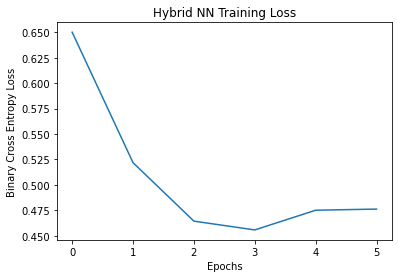

In [40]:
plt.plot(loss_list1)
plt.title('Hybrid NN Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Binary Cross Entropy Loss')

In [12]:
model.eval()
j=0
correct = 0
preds=[]
targets3=[]
with torch.no_grad():

    for batch_idx, (data, target) in enumerate(my_dataloader_test):
        output = model(data)
        targets3.append(target)
        pred = output.argmax(dim=1, keepdim=True) 
        preds.append(pred)
        correct += pred.eq(target.view_as(pred)).sum().item()
        j+=1
        output1=abs((1-target[0])-output[0][target[0]]).unsqueeze(0)
        
        loss = loss_func(output1, target.double())
        total_loss.append(loss.item())
        
    print('Performance on test data:\n\tLoss: {:.4f}\n\tAccuracy: {:.1f}%'.format(
        sum(total_loss) / len(total_loss),
        correct / len(my_dataloader_test) * 100)
        )

Performance on test data:
	Loss: 0.4960
	Accuracy: 83.8%


In [13]:
targets2=[]
for i in range(len(targets3)):
    targets2.append(targets3[i][0].tolist())

In [19]:
preds3=[]
for i in range(len(preds)):
    preds3.append(preds[i][0].tolist())

Confusion matrix, without normalization
[[4097  923]
 [ 701 4279]]


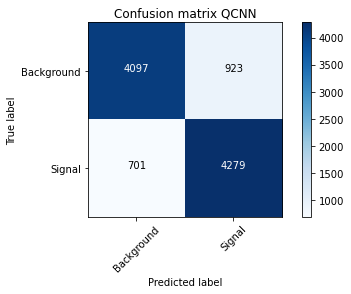

In [22]:
import seaborn as sns
import math
import sys
import pylab
import itertools
import sklearn
from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

cm=confusion_matrix(y_true=targets2,y_pred=preds3)


def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
cm_labels=['Background', 'Signal']    
plot_confusion_matrix(cm=cm,classes=cm_labels,title='Confusion matrix QCNN')